In [1]:
import torch.distributions as distrib
import torch.distributions.transforms as transform
import torch as tr

import matplotlib.pyplot as plt

import numpy as np

# Pytorch distributions and Transforms

In this notebook we will investigate

1. The new [PyTorch distributions](#distribs) module and how to use it
2. How transforming a distribution is expressed as a [change of variables](#change) leading to a flow
3. How we can [chain multiple transforms](#chaining) leading to the overall framework of normalizing flows

## 1. PyTorch distributions

An PyTorch `Distribution` object can always
* samples through the `sample` (or `sample_n`) function
* obtain the analytical density at any given point through the `log_prob` function

Text(0.5, 1.0, 'Gamma')

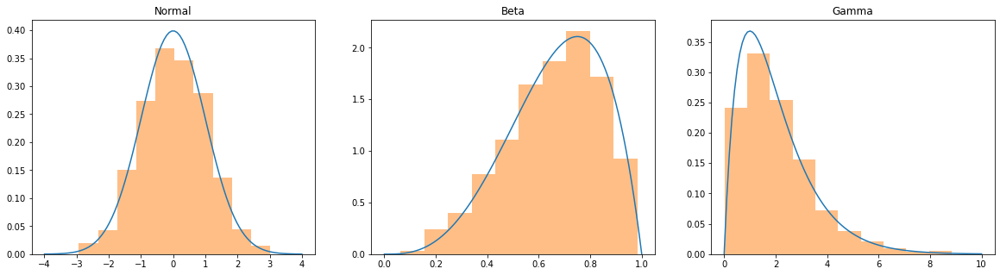

In [2]:
normal = distrib.Normal(loc=0, scale=1)
beta = distrib.Beta(4,2)
gamma = distrib.Gamma(2,1)

fig, axes = plt.subplots(1,3,figsize=(20,5))
axes[0].plot(tr.linspace(-4,4), normal.log_prob(tr.linspace(-4,4)).exp())
axes[0].hist(normal.sample_n(1000), alpha=0.5, density=True)
axes[1].plot(tr.linspace(0,1), beta.log_prob(tr.linspace(0,1)).exp())
axes[1].hist(beta.sample_n(1000), alpha=0.5, density=True)
axes[2].plot(tr.linspace(0,10), gamma.log_prob(tr.linspace(0,10)).exp())
axes[2].hist(gamma.sample_n(1000), alpha=0.5, density=True)
axes[0].set_title("Normal")
axes[1].set_title("Beta")
axes[2].set_title("Gamma")


That nice but such distributions are rather simple. In practise we often need highly expressive distributions e.g. multimodal one to fit data. One way how we can construct new distributions from existing ones is through the **change of variable theorem**

Let $\mathbf{z}\in\mathcal{R}^d$ be a random variable with distribution $q_0(\mathbf{z})$ and $f:\mathcal{R}^d\rightarrow\mathcal{R}^d$ an invertible smooth mapping. We can use $f$ to transform $\mathbf{z}\sim q_0(\mathbf{z})$. The resulting random variable $\mathbf{z}'=f(\mathbf{z})$ has the following probability distribution

$$
q_1(\mathbf{z}')=q_0(f^{-1}(\mathbf{z}))\left|\text{ det}\frac{\partial f^{-1}}{\partial \mathbf{z}'}\right| = q_0(\mathbf{z})\left|\text{ det}\frac{\partial f}{\partial \mathbf{z}}\right|^{-1}
\tag{1}
$$

Fortunately, this can be easily implemented in PyTorch with the `Transform` classes, that already defines some basic probability distribution transforms. For instance, if we define $\mathbf{z}\sim q_0(\mathbf{z})=\mathcal{N}(0, 1)$, we can apply the transform $\mathbf{z}'=exp(\mathbf{z})$ so that $\mathbf{z}'\sim q_1(\mathbf{z}')$

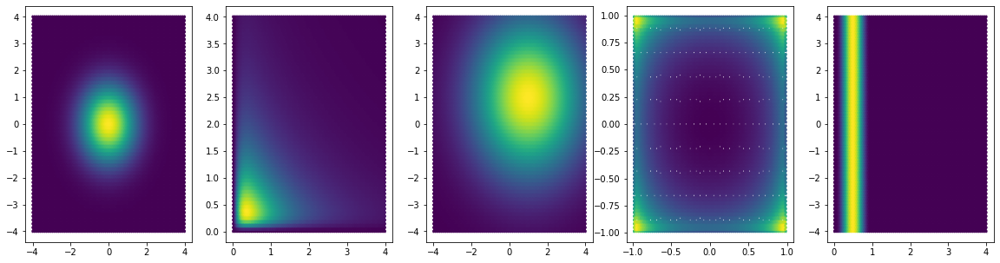

In [3]:
q0 = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))

q1 = distrib.TransformedDistribution(q0, transform.ExpTransform())
q2 = distrib.TransformedDistribution(q0, transform.AffineTransform(tr.ones(2), 2))
q3 = distrib.TransformedDistribution(q0, transform.TanhTransform())
q4 = distrib.TransformedDistribution(q0, transform.StickBreakingTransform())

x = np.linspace(-4, 4, 500)
z = np.array(np.meshgrid(x, x)).transpose(1, 2, 0)
z = np.reshape(z, [z.shape[0] * z.shape[1], -1])
z = tr.tensor(z).float()

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(20, 5))
ax1.hexbin(z[:,0], z[:,1], C=q0.log_prob(z).exp())
ax2.hexbin(z[:,0], z[:,1], C=q1.log_prob(z).exp())
ax3.hexbin(z[:,0], z[:,1], C=q2.log_prob(z).exp())
ax4.hexbin(z[:,0], z[:,1], C=q3.log_prob(z).exp())
ax5.hexbin(z[:,0], z[:,1], C=q4.log_prob(z).exp())

As one can see transformations are very powerfull! We can change the **shape, location, support and location** easily. However we also can make a unimodal gaussian into an mutlimodal distribution which is much more expressive!

## 2. Chaining transforms

With a single change of variable we are still fairly restricted and may need very complicated transformation. However given a random vector $z_0$ with density $p_0$ we can apply we can apply a series of mappings $f_1, f_2, f_3 \dots$ to $z_0$ and obtain a **normalizing flow**. If we apply $K$ normalizing flows we obtain 
$$z_K = f_K\circ f_{K-1} \circ \dots \circ f_1(z_0)  $$
The distribution $q_K$ will hence by given by 
   $$
   \begin{align}
   q_K(\mathbf{z}_K) &= q_0(f_1^{-1} \circ f_{2}^{-1} \circ ... \circ f_K^{-1}(\mathbf{z}_K))\prod_{i=1}^K\left|\text{det}\frac{\partial f^{-1}_i}{\partial\mathbf{z}_{i}}\right|
   = q_0(\mathbf{z_0})\prod_{i=1}^K\left|\text{det}\frac{\partial f_i}{\partial\mathbf{z}_{i-1}}\right|^{-1}
   \end{align}
   \tag{1}
   $$
Typically we use the log density which is then simply given by
   $$
   \begin{align}
   q_0(\mathbf{z_0}) - \sum_{i=1}^K \log \left|\text{det}\frac{\partial f_i}{\partial\mathbf{z}_{i-1}}\right|
   \end{align}
   \tag{2}
   $$

We can see that the original variable flows through the transformations and is normalized through a flow of log determinants. Computing a log determinant has in general a complexity of $\mathcal{O}(d^3)$, where $d$ is the dimension. Hence in **practise** we only consider transformations for that we can compute the log determinant in $\mathcal{O}(n)$

Lets consider how we can change a normal distribution through a sequence of transforatmions.

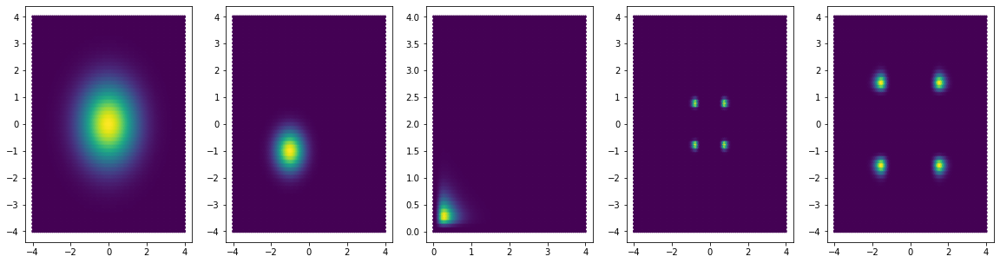

In [127]:
q0 = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))

q1 = distrib.TransformedDistribution(q0, transform.AffineTransform(-tr.ones(2), 0.5))
q2 = distrib.TransformedDistribution(q1, transform.ExpTransform())
q3 = distrib.TransformedDistribution(q2, transform.PowerTransform(1/4))
q4 = distrib.TransformedDistribution(q3, transform.AffineTransform(tr.zeros(2), 2))

x = np.linspace(-4, 4, 500)
z = np.array(np.meshgrid(x, x)).transpose(1, 2, 0)
z = np.reshape(z, [z.shape[0] * z.shape[1], -1])
z = tr.tensor(z).float()

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(20, 5))
ax1.hexbin(z[:,0], z[:,1], C=q0.log_prob(z).exp())
ax2.hexbin(z[:,0], z[:,1], C=q1.log_prob(z).exp())
ax3.hexbin(z[:,0], z[:,1], C=q2.log_prob(z).exp())
ax4.hexbin(z[:,0], z[:,1], C=q3.log_prob(z).exp())
ax5.hexbin(z[:,0], z[:,1], C=q4.log_prob(z).exp())

Notice how we obtained from a unimodal Gaussian distribution a multimodal distribution, pretty nice! However it is not obvious which sequence of transformations is necessary to obtain a specific distribution. Further transformations have paramters that have to be set. Hence optimally we want to construct highly expressive paramtericed transformations and then learn the necessary paratmers!